# U.S. County Excessive Drinking: Map, Explain, and Predict

This notebook starts from a simple goal — *reproduce a county-level choropleth of
excessive drinking* — and grows it into a full analysis: we map the measure,
validate it, cross-check it against independent data sources, then **model it** to
answer a sharper question:

> **What county characteristics are associated with higher excessive drinking, and
> how well can we predict a county's rate from its socioeconomic, demographic, and
> behavioral profile?**

### What the target measures

The County Health Rankings field `v049_rawvalue` is the **age-adjusted percentage of
adults reporting binge or heavy drinking** (derived from CDC BRFSS). It is a *modeled
survey estimate* — not alcohol sales, not alcohol-use-disorder prevalence, not
alcohol-related deaths. Keeping that definition in mind is essential to interpreting
everything below.

### Notebook roadmap

1. **Setup** — libraries and reproducible paths.
2. **Load & cache data** — County Health Rankings, with provenance tracking.
3. **The target** — extract, validate, and explore the distribution.
4. **Reproduce the map** — the original choropleth, plus an "honest" palette and an uncertainty map.
5. **Cross-source validation** — CDC PLACES (county) and NIAAA (state).
6. **Feature engineering** — a curated, *verified* set of ~30 county predictors.
7. **Exploratory analysis** — what correlates with drinking, and how.
8. **Modeling** — baseline → linear → tree ensembles, with state-grouped cross-validation.
9. **Interpretation** — permutation importance, SHAP, partial dependence, spatial residuals.
10. **Conclusions** — what we learned and the limits of it.

### Headline results (spoilers)

- County estimates are tightly clustered (middle 80% ≈ 13–20%), with a strong **regional** signal: the **Upper Midwest** runs high, the **South** and **Utah** run low.
- The pattern is **robust across measurement systems** (CDC PLACES, NIAAA sales).
- County drinking is **partly predictable** (R² ≈ 0.4–0.5 on held-out states) from
  demographics, socioeconomics, and co-occurring health behaviors. Interestingly, a
  regularized **linear** model is as accurate as gradient boosting here — the structure
  is largely additive. The strongest associated features are **physical inactivity,
  age structure, demographic composition, and social connectedness**.

## 1. Setup

We use `pandas`/`numpy` for data work, `plotly` for interactive maps,
`matplotlib`/`seaborn` for statistical plots, and `scikit-learn` + `lightgbm` + `shap`
for modeling and interpretation. Everything downloads from official sources and is
cached locally on first run.

In [1]:
from __future__ import annotations

import hashlib
import json
import warnings
from datetime import datetime, timezone
from pathlib import Path
from typing import Final
from urllib.error import HTTPError, URLError
from urllib.request import Request, urlopen

import numpy as np
import pandas as pd
import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

pio.renderers.default = "notebook_connected"
sns.set_theme(style="whitegrid", context="notebook")
pd.set_option("display.max_columns", 60)
warnings.filterwarnings("ignore", category=FutureWarning)

RANDOM_STATE: Final[int] = 42

In [2]:
PROJECT_ROOT: Final[Path] = Path.cwd()

# If run from the notebooks/ folder, step up to the project root.
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

DATA_DIR: Final[Path] = PROJECT_ROOT / "data"
RAW_DIR: Final[Path] = DATA_DIR / "raw"
PROCESSED_DIR: Final[Path] = DATA_DIR / "processed"
OUTPUT_DIR: Final[Path] = PROJECT_ROOT / "outputs"

for directory in (RAW_DIR, PROCESSED_DIR, OUTPUT_DIR):
    directory.mkdir(parents=True, exist_ok=True)

# Local caches for every remote source, so reruns are offline-reproducible.
LOCAL_CHR_PATH: Final[Path] = RAW_DIR / "analytic_data2024.csv"
LOCAL_GEOJSON_PATH: Final[Path] = RAW_DIR / "geojson-counties-fips.json"
LOCAL_PLACES_PATH: Final[Path] = RAW_DIR / "cdc_places_binge_2023.csv"
LOCAL_NIAAA_PATH: Final[Path] = RAW_DIR / "niaaa_pcyr1970-2023.txt"
PROVENANCE_PATH: Final[Path] = RAW_DIR / "provenance.json"

CHR_2024_URL: Final[str] = (
    "https://www.countyhealthrankings.org/sites/default/files/media/document/"
    "analytic_data2024.csv"
)
COUNTY_GEOJSON_URL: Final[str] = (
    "https://raw.githubusercontent.com/plotly/datasets/master/"
    "geojson-counties-fips.json"
)

# Excessive drinking is a percentage in [0, 100]; used to validate scaling.
PLAUSIBLE_PCT_RANGE: Final[tuple[float, float]] = (0.0, 100.0)

# CHR stores rate fields as proportions (e.g. 0.172). A field whose maximum is at
# or below this cutoff is treated as a proportion and multiplied by 100.
PROPORTION_MAX_CUTOFF: Final[float] = 1.5

# Total resident population field in the CHR analytic file.
POPULATION_FIELD: Final[str] = "v051_rawvalue"

# Choropleth styling, kept explicit so the binning choice is auditable.
DRINKING_COLOR_SCALE: Final[list] = [
    [0.00, "#8AF27B"], [0.25, "#2E8B3C"], [0.35, "#F4D35E"],
    [0.55, "#F29E38"], [0.70, "#E6392E"], [0.85, "#A4161A"], [1.00, "#7B2CBF"],
]
DRINKING_RANGE_COLOR: Final[tuple[float, float]] = (9.0, 27.0)

In [3]:
def record_provenance(source: str, url: str, local_path: Path, n_records: int) -> dict:
    """
    Record where a dataset came from and what we got.

    Writes one entry per source to ``data/raw/provenance.json`` capturing the URL,
    fetch timestamp, a SHA-256 of the cached file, and the row count, so a rerun is
    auditable even though the cached files are not version-pinned.
    """
    digest = (
        hashlib.sha256(local_path.read_bytes()).hexdigest()
        if local_path.exists() else None
    )
    record = {
        "source": source,
        "url": url,
        "local_path": str(local_path),
        "fetched_utc": datetime.now(timezone.utc).isoformat(timespec="seconds"),
        "sha256": digest,
        "n_records": int(n_records),
    }
    existing = json.loads(PROVENANCE_PATH.read_text()) if PROVENANCE_PATH.exists() else []
    existing = [r for r in existing if r.get("source") != source]
    existing.append(record)
    PROVENANCE_PATH.write_text(json.dumps(existing, indent=2))
    return record

## 2. Load and cache the County Health Rankings data

The County Health Rankings (CHR) *analytic* file is a single wide CSV: one row per
county and **770 columns** covering health outcomes, health behaviors, clinical care,
social and economic factors, the physical environment, and demographics. That breadth
is exactly what makes it a good basis for modeling — most of our predictors come from
this one file.

The loader caches the file locally on first download and records its provenance.

In [4]:
def load_county_health_rankings(
    local_path: Path = LOCAL_CHR_PATH, url: str = CHR_2024_URL
) -> pd.DataFrame:
    """
    Load County Health Rankings analytic data, caching the remote file locally.

    Raises
    ------
    FileNotFoundError
        If the remote download fails and no local file exists.
    """
    if not isinstance(local_path, Path):
        raise TypeError("local_path must be a pathlib.Path.")
    if not isinstance(url, str):
        raise TypeError("url must be a string.")

    if not local_path.exists():
        print(f"Local file not found. Downloading from: {url}")
        try:
            request = Request(url, headers={"User-Agent": "Mozilla/5.0"})
            local_path.write_bytes(urlopen(request).read())
        except Exception as exc:
            raise FileNotFoundError(
                "Could not download the County Health Rankings analytic data. "
                f"Download it manually and save it as {local_path}."
            ) from exc
    else:
        print(f"Loading cached file: {local_path}")

    dtype = {"statecode": "string", "countycode": "string", "fipscode": "string"}
    frame = pd.read_csv(local_path, dtype=dtype, low_memory=False)
    record_provenance("county_health_rankings", url, local_path, len(frame))
    return frame


raw_data = load_county_health_rankings()
print(f"Shape: {raw_data.shape[0]:,} rows x {raw_data.shape[1]:,} columns")
raw_data[["fipscode", "state", "county", "v049_rawvalue"]].head()

Loading cached file: C:\Users\diogo\work_code\ds-projects-portfolio\projects\excessive_drinking_map_reproduction\data\raw\analytic_data2024.csv


Shape: 3,195 rows x 770 columns


,fipscode,state,county,v049_rawvalue
0,00000,US,United States,0.181104
1,01000,AL,Alabama,0.144775
2,01001,AL,Autauga County,0.152378
3,01003,AL,Baldwin County,0.164226
4,01005,AL,Barbour County,0.122772


## 3. The target: excessive drinking

CHR rate fields are stored as proportions (e.g. `0.172` for 17.2%). We detect the
scale **once** from the raw value and apply the same factor to the estimate and both
confidence-interval bounds, so they can never be scaled inconsistently. We also carry
each county's population for later population-weighting.

In [5]:
def percentage_scale_factor(series: pd.Series) -> float:
    """Return the multiplier that converts a CHR field to percentage points."""
    max_value = pd.to_numeric(series, errors="coerce").max(skipna=True)
    if pd.isna(max_value):
        return 1.0
    return 100.0 if max_value <= PROPORTION_MAX_CUTOFF else 1.0


def extract_excessive_drinking(data: pd.DataFrame) -> pd.DataFrame:
    """Extract the tidy county-level excessive drinking table (estimate, CI, population)."""
    required = {
        "fipscode", "state", "county", "countycode",
        "v049_rawvalue", "v049_cilow", "v049_cihigh", POPULATION_FIELD,
    }
    missing = required.difference(data.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    work = data.copy()
    work["countycode"] = work["countycode"].astype("string").str.zfill(3)
    work = work.loc[work["countycode"] != "000"].copy()       # drop state/US rows
    work["fips"] = work["fipscode"].astype("string").str.zfill(5)

    factor = percentage_scale_factor(work["v049_rawvalue"])
    work["excessive_drinking_pct"] = pd.to_numeric(work["v049_rawvalue"], errors="coerce") * factor
    work["ci_low_pct"] = pd.to_numeric(work["v049_cilow"], errors="coerce") * factor
    work["ci_high_pct"] = pd.to_numeric(work["v049_cihigh"], errors="coerce") * factor
    work["population"] = pd.to_numeric(work[POPULATION_FIELD], errors="coerce")

    cols = ["fips", "state", "county", "excessive_drinking_pct",
            "ci_low_pct", "ci_high_pct", "population"]
    tidy = work.loc[work["excessive_drinking_pct"].notna(), cols].copy()
    return tidy.sort_values(["state", "county"]).reset_index(drop=True)


drinking_data = extract_excessive_drinking(raw_data)
processed_path = OUTPUT_DIR / "excessive_drinking_county_2024.csv"
drinking_data.to_csv(processed_path, index=False)
print(f"Saved tidy target: {processed_path}")
drinking_data.head()

Saved tidy target: C:\Users\diogo\work_code\ds-projects-portfolio\projects\excessive_drinking_map_reproduction\outputs\excessive_drinking_county_2024.csv


,fips,state,county,excessive_drinking_pct,ci_low_pct,ci_high_pct,population
0,02013,AK,Aleutians East Borough,15.718334,12.444263,19.454598,3398
1,02016,AK,Aleutians West Census Area,19.573867,16.150003,24.265236,5122
2,02020,AK,Anchorage Borough,19.954257,17.259400,22.706131,287145
3,02050,AK,Bethel Census Area,18.849642,15.227637,22.584967,18257
4,02060,AK,Bristol Bay Borough,19.510612,15.718417,23.571270,865


### Validate before trusting

A few assertions catch the bugs that silently corrupt geographic analyses: malformed
or duplicated FIPS, implausible percentages, a confidence interval that does not
bracket the estimate, or leftover state-summary rows.

In [6]:
def validate_drinking_data(data: pd.DataFrame) -> None:
    """Assert structural and value invariants on the tidy county data."""
    low, high = PLAUSIBLE_PCT_RANGE
    assert data["fips"].str.len().eq(5).all(), "All FIPS codes must be 5 characters."
    assert data["fips"].is_unique, "FIPS codes must be unique."
    assert not data["fips"].str.endswith("000").any(), "State-summary rows present."
    assert data["excessive_drinking_pct"].between(low, high).all(), "Estimate out of range."
    assert (
        (data["ci_low_pct"] <= data["excessive_drinking_pct"])
        & (data["excessive_drinking_pct"] <= data["ci_high_pct"])
    ).all(), "Estimate must lie within its confidence interval."
    assert data["population"].gt(0).all(), "Population must be positive."
    print(f"Validation passed for {len(data):,} counties.")


validate_drinking_data(drinking_data)

Validation passed for 3,143 counties.


### Distribution of the target

Two things matter for modeling. First, **how spread out** is the target? Second, is it
roughly symmetric or skewed (which affects linear models and error metrics)? The
estimates are mildly right-skewed but close enough to symmetric that we model them
directly, without a transform.

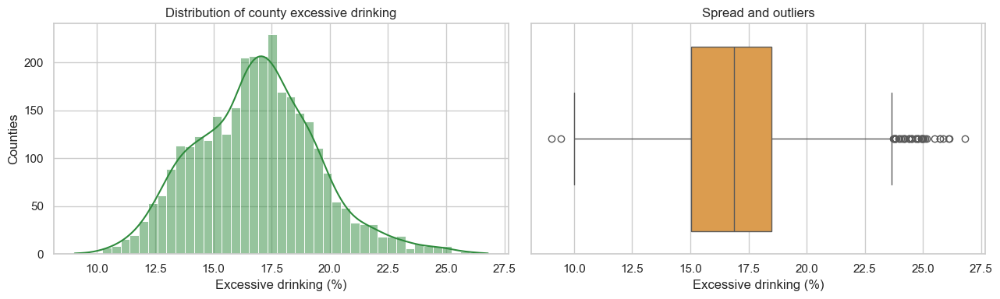

,metric,value
0,Counties,"3,143"
1,Mean,16.87%
2,Median,16.89%
3,Std dev,2.62
4,Skew,0.28
5,10th pct,13.45%
6,90th pct,20.05%
7,Min,9.04%
8,Max,26.80%


In [7]:
est = drinking_data["excessive_drinking_pct"]
summary = pd.DataFrame({
    "metric": ["Counties", "Mean", "Median", "Std dev", "Skew",
               "10th pct", "90th pct", "Min", "Max"],
    "value": [
        f"{len(est):,}", f"{est.mean():.2f}%", f"{est.median():.2f}%",
        f"{est.std():.2f}", f"{est.skew():.2f}", f"{est.quantile(.10):.2f}%",
        f"{est.quantile(.90):.2f}%", f"{est.min():.2f}%", f"{est.max():.2f}%",
    ],
})

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
sns.histplot(est, bins=45, kde=True, color="#2E8B3C", ax=axes[0])
axes[0].set(title="Distribution of county excessive drinking",
            xlabel="Excessive drinking (%)", ylabel="Counties")
sns.boxplot(x=est, color="#F29E38", ax=axes[1])
axes[1].set(title="Spread and outliers", xlabel="Excessive drinking (%)")
plt.tight_layout(); plt.show()
summary

### Highest and lowest counties — with uncertainty

These are *modeled* estimates with confidence intervals. The plot makes the key caveat
visual: within the top and bottom groups, the intervals overlap heavily, so the exact
rank order is not statistically meaningful.

In [8]:
top_10 = drinking_data.nlargest(10, "excessive_drinking_pct")[
    ["county", "state", "excessive_drinking_pct", "ci_low_pct", "ci_high_pct"]]
bottom_10 = drinking_data.nsmallest(10, "excessive_drinking_pct")[
    ["county", "state", "excessive_drinking_pct", "ci_low_pct", "ci_high_pct"]]
display(top_10); display(bottom_10)

,county,state,excessive_drinking_pct,ci_low_pct,ci_high_pct
1614,Gallatin County,MT,26.797762,23.177842,30.676209
3037,Outagamie County,WI,26.134563,22.117670,30.703054
3008,Douglas County,WI,26.080720,21.438968,30.968325
3010,Eau Claire County,WI,25.875464,21.428877,30.515639
3040,Pierce County,WI,25.729597,21.169946,30.553119
3005,Dane County,WI,25.728594,22.226512,29.595545
1630,Missoula County,MT,25.493887,22.149387,29.178890
2994,Ashland County,WI,25.170090,21.420228,29.275439
3029,Marathon County,WI,25.101975,21.176969,29.312004
3052,St. Croix County,WI,25.021317,20.652232,29.787295


,county,state,excessive_drinking_pct,ci_low_pct,ci_high_pct
2802,Utah County,UT,9.038096,7.664016,10.595150
61,Greene County,AL,9.443847,7.239540,11.940713
2793,Piute County,UT,10.015070,7.836175,12.745046
1933,Catron County,NM,10.237931,7.835114,12.896556
507,Randolph County,GA,10.273446,8.026666,12.934891
1543,Humphreys County,MS,10.274231,7.800050,13.214321
150,Phillips County,AR,10.356883,8.072773,12.897787
3091,McDowell County,WV,10.376149,8.066985,13.081648
105,Chicot County,AR,10.570627,8.143715,13.225739
95,Wilcox County,AL,10.591710,8.238723,13.536627


In [9]:
extremes = pd.concat([
    drinking_data.nlargest(15, "excessive_drinking_pct"),
    drinking_data.nsmallest(15, "excessive_drinking_pct"),
]).copy()
extremes["location_name"] = extremes["county"] + ", " + extremes["state"]
extremes["err_high"] = extremes["ci_high_pct"] - extremes["excessive_drinking_pct"]
extremes["err_low"] = extremes["excessive_drinking_pct"] - extremes["ci_low_pct"]
extremes = extremes.sort_values("excessive_drinking_pct")

fig = px.scatter(
    extremes, x="excessive_drinking_pct", y="location_name",
    error_x="err_high", error_x_minus="err_low",
    labels={"excessive_drinking_pct": "Excessive drinking (%)", "location_name": ""},
    title="Highest and lowest counties with 95% confidence intervals",
)
fig.update_layout(height=700, margin={"l": 0, "r": 0, "t": 60, "b": 0})
fig.show()

## 4. Reproduce the choropleth

The original goal. Plotly joins the county estimates to a county GeoJSON by FIPS. The
palette approximates the green-yellow-red-purple scheme of the source screenshot.

In [10]:
def load_county_geojson(
    url: str = COUNTY_GEOJSON_URL, local_path: Path = LOCAL_GEOJSON_PATH
) -> dict:
    """Load U.S. county boundaries as GeoJSON, caching the file locally."""
    if not local_path.exists():
        try:
            with urlopen(url) as response:
                local_path.write_bytes(response.read())
        except (HTTPError, URLError) as exc:
            raise RuntimeError(f"Could not download county GeoJSON from {url}") from exc
    geojson = json.loads(local_path.read_text())
    record_provenance("county_geojson", url, local_path, len(geojson.get("features", [])))
    return geojson


county_geojson = load_county_geojson()
print(f"GeoJSON features: {len(county_geojson['features']):,}")

GeoJSON features: 3,221


### Coverage check (don't drop counties silently)

A choropleth silently omits any county whose FIPS is missing from the geometry. The
public GeoJSON predates several FIPS changes, so a handful of counties have estimates
but no boundary — the reorganized Alaska census areas and Oglala Lakota County, SD
(formerly Shannon County). We surface those drops instead of hiding them.

In [11]:
def check_geographic_coverage(data: pd.DataFrame, county_geojson: dict) -> pd.DataFrame:
    """Report county estimates with no geometry, and geometries with no data."""
    data_fips = set(data["fips"])
    geo_fips = {f["id"] for f in county_geojson["features"]}
    unmapped = sorted(data_fips - geo_fips)
    print(f"County estimates:                     {len(data_fips):>5}")
    print(f"GeoJSON counties:                     {len(geo_fips):>5}")
    print(f"Estimates with no geometry (dropped): {len(unmapped):>5}")
    print(f"Geometries with no estimate (blank):  {len(geo_fips - data_fips):>5}")
    dropped = data.loc[data["fips"].isin(unmapped), ["fips", "county", "state"]]
    if len(dropped):
        print("\nDropped from the map:")
        print(dropped.to_string(index=False))
    return dropped.copy()


unmapped_counties = check_geographic_coverage(drinking_data, county_geojson)

County estimates:                      3143
GeoJSON counties:                      3221
Estimates with no geometry (dropped):     4
Geometries with no estimate (blank):     82

Dropped from the map:
 fips                   county state
02063      Chugach Census Area    AK
02066 Copper River Census Area    AK
02158     Kusilvak Census Area    AK
46102     Oglala Lakota County    SD


In [12]:
def make_choropleth(data, county_geojson, color_scale=DRINKING_COLOR_SCALE,
                    range_color=DRINKING_RANGE_COLOR,
                    title="U.S. counties by excessive drinking rate, 2024"):
    """Build a U.S. county choropleth for excessive drinking."""
    plot_data = data.copy()
    plot_data["location_name"] = plot_data["county"] + ", " + plot_data["state"]
    fig = px.choropleth(
        plot_data, geojson=county_geojson, locations="fips", featureidkey="id",
        color="excessive_drinking_pct", scope="usa",
        color_continuous_scale=color_scale, range_color=range_color,
        hover_name="location_name",
        hover_data={"fips": True, "excessive_drinking_pct": ":.2f",
                    "state": False, "county": False, "location_name": False},
        labels={"excessive_drinking_pct": "Excessive drinking (%)"}, title=title,
    )
    fig.update_geos(visible=False)
    fig.update_layout(margin={"r": 0, "t": 70, "l": 0, "b": 0},
                      coloraxis_colorbar={"title": "Percent", "ticksuffix": "%"})
    return fig


fig = make_choropleth(drinking_data, county_geojson)
fig.show()
map_image_path = OUTPUT_DIR / "excessive_drinking_county_2024.png"
pio.write_image(fig, str(map_image_path), format="png", width=1600, height=900, scale=2)
fig.write_html(OUTPUT_DIR / "excessive_drinking_county_2024.html", include_plotlyjs="cdn")
print(f"Saved static + interactive maps to {OUTPUT_DIR}")

Saved static + interactive maps to C:\Users\diogo\work_code\ds-projects-portfolio\projects\excessive_drinking_map_reproduction\outputs


### Two honest companions to the map

The screenshot-style palette is tuned for drama. A perceptually-uniform **Viridis**
scale with a data-driven range tells the same regional story more soberly. And because
these are modeled estimates, an **uncertainty map** (confidence-interval width) shows
*where* the estimates are noisiest — typically small-population counties. Read the
value map and the uncertainty map together.

In [13]:
q_range = (drinking_data["excessive_drinking_pct"].quantile(0.02),
           drinking_data["excessive_drinking_pct"].quantile(0.98))
fig_v = make_choropleth(drinking_data, county_geojson, color_scale="Viridis",
                        range_color=q_range,
                        title="Excessive drinking, 2024 (Viridis, 2nd-98th pct)")
fig_v.show()

In [14]:
def make_uncertainty_choropleth(data, county_geojson):
    """County choropleth of confidence-interval width (estimate uncertainty)."""
    plot = data.copy()
    plot["ci_width_pct"] = plot["ci_high_pct"] - plot["ci_low_pct"]
    plot["location_name"] = plot["county"] + ", " + plot["state"]
    fig = px.choropleth(
        plot, geojson=county_geojson, locations="fips", featureidkey="id",
        color="ci_width_pct", scope="usa", color_continuous_scale="Purples",
        hover_name="location_name",
        hover_data={"ci_width_pct": ":.2f", "excessive_drinking_pct": ":.2f", "fips": True},
        labels={"ci_width_pct": "CI width (pp)"},
        title="Estimate uncertainty: confidence-interval width by county, 2024",
    )
    fig.update_geos(visible=False)
    fig.update_layout(margin={"r": 0, "t": 70, "l": 0, "b": 0},
                      coloraxis_colorbar={"title": "CI width", "ticksuffix": "pp"})
    return fig


make_uncertainty_choropleth(drinking_data, county_geojson).show()

## 5. Cross-source validation

Before modeling, we sanity-check the target against two **independent** measurement
systems. They should not match exactly — different definitions, methods, and
geographies — but if the broad pattern survives across them, we can trust it.

- **CDC PLACES (2023)** — county-level *binge* drinking, age-adjusted prevalence. A
  different small-area model of a *narrower* behavior.
- **NIAAA (2023)** — state-level *apparent per-capita alcohol consumption* from sales.
  A completely different instrument (administrative sales, not a survey).

We report both **Pearson** (linear) and **Spearman** (rank) correlations; the rank
correlation is the honest measure of "same broad pattern".

Matched counties: 2,948
CHR mean 16.95%  |  PLACES mean 17.78%
Pearson r = 0.748   Spearman rho = 0.753


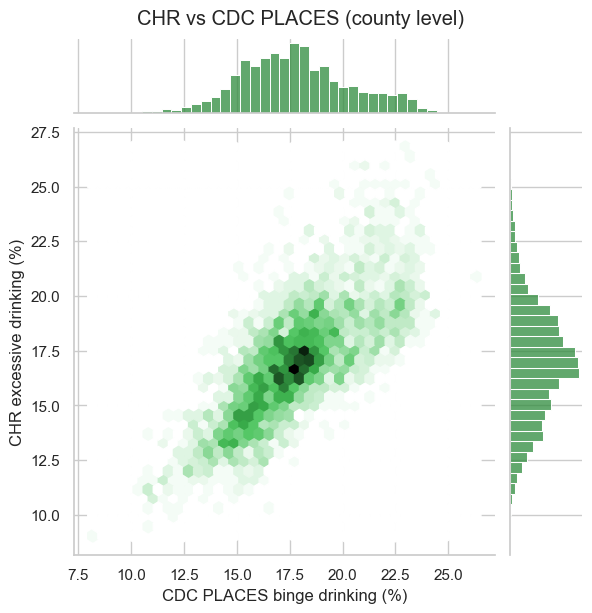

In [15]:
def load_cdc_places_binge(year: int = 2023, local_path: Path = LOCAL_PLACES_PATH) -> pd.DataFrame:
    """Load county-level binge drinking estimates from CDC PLACES, cached locally."""
    url = (
        "https://data.cdc.gov/resource/swc5-untb.csv?"
        "%24select=year%2Cstateabbr%2Cstatedesc%2Clocationname%2Clocationid%2C"
        "data_value%2Clow_confidence_limit%2Chigh_confidence_limit&"
        f"%24where=measureid%3D%27BINGE%27%20AND%20datavaluetypeid%3D%27AgeAdjPrv%27"
        f"%20AND%20year%3D%27{year}%27&%24limit=5000"
    )
    if not local_path.exists():
        pd.read_csv(url, dtype={"locationid": "string"}).to_csv(local_path, index=False)
    places = pd.read_csv(local_path, dtype={"locationid": "string"}).rename(columns={
        "stateabbr": "state", "locationid": "fips", "data_value": "places_binge_pct",
        "low_confidence_limit": "places_ci_low_pct", "high_confidence_limit": "places_ci_high_pct",
    })
    for c in ["places_binge_pct", "places_ci_low_pct", "places_ci_high_pct"]:
        places[c] = pd.to_numeric(places[c], errors="coerce")
    record_provenance("cdc_places_binge", url, local_path, len(places))
    return places.sort_values("fips").reset_index(drop=True)


places_binge = load_cdc_places_binge()
places_comparison = drinking_data.merge(
    places_binge[["fips", "places_binge_pct"]], on="fips", how="inner")
places_comparison["gap"] = (
    places_comparison["excessive_drinking_pct"] - places_comparison["places_binge_pct"])
places_comparison.to_csv(OUTPUT_DIR / "excessive_drinking_vs_places_county_2023.csv", index=False)

pear = places_comparison["excessive_drinking_pct"].corr(places_comparison["places_binge_pct"])
spear = places_comparison["excessive_drinking_pct"].corr(
    places_comparison["places_binge_pct"], method="spearman")
print(f"Matched counties: {len(places_comparison):,}")
print(f"CHR mean {places_comparison['excessive_drinking_pct'].mean():.2f}%  |  "
      f"PLACES mean {places_comparison['places_binge_pct'].mean():.2f}%")
print(f"Pearson r = {pear:.3f}   Spearman rho = {spear:.3f}")

g = sns.jointplot(data=places_comparison, x="places_binge_pct", y="excessive_drinking_pct",
                  kind="hex", height=6, color="#2E8B3C")
g.set_axis_labels("CDC PLACES binge drinking (%)", "CHR excessive drinking (%)")
g.fig.suptitle("CHR vs CDC PLACES (county level)", y=1.02)
plt.show()

In [16]:
STATE_FIPS_TO_ABBR = {
    1:"AL",2:"AK",4:"AZ",5:"AR",6:"CA",8:"CO",9:"CT",10:"DE",11:"DC",12:"FL",13:"GA",
    15:"HI",16:"ID",17:"IL",18:"IN",19:"IA",20:"KS",21:"KY",22:"LA",23:"ME",24:"MD",
    25:"MA",26:"MI",27:"MN",28:"MS",29:"MO",30:"MT",31:"NE",32:"NV",33:"NH",34:"NJ",
    35:"NM",36:"NY",37:"NC",38:"ND",39:"OH",40:"OK",41:"OR",42:"PA",44:"RI",45:"SC",
    46:"SD",47:"TN",48:"TX",49:"UT",50:"VT",51:"VA",53:"WA",54:"WV",55:"WI",56:"WY",
}
NIAAA_URL: Final[str] = "https://www.niaaa.nih.gov/sites/default/files/pcyr1970-2023.txt"
NIAAA_COLUMNS: Final[list] = [
    "year","geo_id","beverage_type","gallons_beverage","gallons_ethanol",
    "population_14plus","per_capita_14plus_raw","decile_14plus","population_21plus",
    "per_capita_21plus_raw","decile_21plus","data_source_type","abv_raw","gallons_ethanol_tv",
]
NIAAA_ALL_BEVERAGES: Final[int] = 4
NIAAA_PER_CAPITA_DIVISOR: Final[float] = 10000.0


def load_niaaa_state_consumption(year: int = 2023, local_path: Path = LOCAL_NIAAA_PATH) -> pd.DataFrame:
    """Load apparent per-capita alcohol consumption from NIAAA, cached locally."""
    if not local_path.exists():
        request = Request(NIAAA_URL, headers={"User-Agent": "Mozilla/5.0"})
        local_path.write_bytes(urlopen(request).read())
    text = local_path.read_text(encoding="utf-8")
    records = [p for p in (ln.split() for ln in text.splitlines())
               if len(p) == len(NIAAA_COLUMNS) and p[0].isdigit()]
    if not records:
        raise ValueError("Parsed zero NIAAA rows; the file layout may have changed.")
    niaaa = pd.DataFrame(records, columns=NIAAA_COLUMNS)
    for c in ["year", "geo_id", "beverage_type", "per_capita_14plus_raw"]:
        niaaa[c] = pd.to_numeric(niaaa[c], errors="coerce")
    niaaa = niaaa[(niaaa["year"] == year) & (niaaa["beverage_type"] == NIAAA_ALL_BEVERAGES)
                  & (niaaa["geo_id"].isin(STATE_FIPS_TO_ABBR))].copy()
    if len(niaaa) != len(STATE_FIPS_TO_ABBR):
        raise ValueError(f"Expected {len(STATE_FIPS_TO_ABBR)} NIAAA rows, got {len(niaaa)}.")
    niaaa["state"] = niaaa["geo_id"].map(STATE_FIPS_TO_ABBR)
    niaaa["niaaa_gallons_per_capita"] = niaaa["per_capita_14plus_raw"] / NIAAA_PER_CAPITA_DIVISOR
    record_provenance("niaaa_per_capita", NIAAA_URL, local_path, len(niaaa))
    return niaaa[["state", "niaaa_gallons_per_capita"]].sort_values("state")


def population_weighted_mean(frame, value_col, weight_col):
    w = frame[weight_col]; total = w.sum()
    return float((frame[value_col] * w).sum() / total) if total else float("nan")


niaaa_state = load_niaaa_state_consumption()
state_summary = (drinking_data.groupby("state")
    .apply(lambda g: pd.Series({
        "counties": len(g),
        "mean_estimate": g["excessive_drinking_pct"].mean(),
        "pop_weighted_estimate": population_weighted_mean(g, "excessive_drinking_pct", "population"),
    })).reset_index())
state_external = state_summary.merge(niaaa_state, on="state", how="inner")
state_external.to_csv(OUTPUT_DIR / "excessive_drinking_vs_niaaa_state_2023.csv", index=False)

pear = state_external["pop_weighted_estimate"].corr(state_external["niaaa_gallons_per_capita"])
spear = state_external["pop_weighted_estimate"].corr(
    state_external["niaaa_gallons_per_capita"], method="spearman")
print(f"States matched: {len(state_external)}")
print(f"Pop-weighted CHR vs NIAAA sales:  Pearson {pear:.3f}  Spearman {spear:.3f}")

fig = px.scatter(state_external, x="niaaa_gallons_per_capita", y="pop_weighted_estimate",
    text="state", labels={"niaaa_gallons_per_capita": "NIAAA gallons per capita (14+)",
    "pop_weighted_estimate": "Pop-weighted excessive drinking (%)"},
    title="State comparison: CHR survey prevalence vs NIAAA alcohol sales")
fig.update_traces(textposition="top center"); fig.show()

States matched: 51
Pop-weighted CHR vs NIAAA sales:  Pearson 0.510  Spearman 0.557


**Takeaway.** The county-level correlation with CDC PLACES is strong, and the
state-level correlation with NIAAA sales is moderate. Different instruments, same broad
geography — the target is measuring something real and stable, so it is worth modeling.

## 6. Feature engineering: a curated, verified predictor set

The CHR file has 770 columns, but the column names are opaque codes (`v009_rawvalue`)
with **no description row**. Rather than dump all 770 columns into a model, we use a
**curated set of ~30 predictors whose meaning we verified** against known value ranges
and anchor counties (e.g. confirming `v054` is % non-Hispanic Black because Holmes
County, MS reads 82%, and `v056` is % Hispanic because Los Angeles reads 49%).

### Avoiding leakage

We deliberately **exclude**:

- the target's own confidence bounds;
- **alcohol-impaired driving deaths** (`v134`) — a direct *consequence* of drinking;
- **CDC PLACES binge drinking** — essentially the same construct measured differently
  (it belongs in validation, not as a predictor).

We also lean toward **upstream** factors (socioeconomic, demographic, environmental)
and *co-occurring* health behaviors, and avoid downstream health outcomes that drinking
itself helps cause. Everything here is **associational**, not causal.

In [17]:
# Verified CHR variable code -> (readable name, category).
FEATURE_DEFS: dict = {
    # --- Health behaviors (co-occurring lifestyle factors) ---
    "v009": ("Adult smoking", "Health behavior"),
    "v011": ("Adult obesity", "Health behavior"),
    "v070": ("Physical inactivity", "Health behavior"),
    "v132": ("Access to exercise opportunities", "Health behavior"),
    "v133": ("Food environment index", "Health behavior"),
    "v045": ("Sexually transmitted infections", "Health behavior"),
    "v014": ("Teen birth rate", "Health behavior"),
    "v050": ("Mammography screening", "Health behavior"),
    "v155": ("Flu vaccinations", "Health behavior"),
    # --- Socioeconomic factors ---
    "v063": ("Median household income", "Socioeconomic"),
    "v024": ("Children in poverty", "Socioeconomic"),
    "v044": ("Income inequality (80/20)", "Socioeconomic"),
    "v023": ("Unemployment", "Socioeconomic"),
    "v069": ("Some college", "Socioeconomic"),
    "v021": ("High school completion", "Socioeconomic"),
    "v082": ("Single-parent households", "Socioeconomic"),
    "v085": ("Uninsured", "Socioeconomic"),
    "v153": ("Homeownership", "Socioeconomic"),
    "v140": ("Social associations", "Socioeconomic"),
    "v136": ("Severe housing problems", "Socioeconomic"),
    "v067": ("Driving alone to work", "Socioeconomic"),
    # --- Demographics ---
    "v052": ("Percent under 18", "Demographic"),
    "v053": ("Percent 65 and older", "Demographic"),
    "v057": ("Percent female", "Demographic"),
    "v058": ("Percent rural", "Demographic"),
    "v054": ("Percent non-Hispanic Black", "Demographic"),
    "v055": ("Percent American Indian / AK Native", "Demographic"),
    "v056": ("Percent Hispanic", "Demographic"),
    "v081": ("Percent Asian", "Demographic"),
    "v126": ("Percent non-Hispanic White", "Demographic"),
    # --- Physical environment ---
    "v125": ("Air pollution (PM2.5)", "Environment"),
}
FEATURE_NAMES = list(name for name, _ in FEATURE_DEFS.values()) + ["Log population"]
print(f"{len(FEATURE_NAMES)} features across "
      f"{len({c for _, c in FEATURE_DEFS.values()})} categories.")

32 features across 4 categories.


In [18]:
def build_feature_frame(raw: pd.DataFrame, target: pd.DataFrame) -> pd.DataFrame:
    """Assemble the modeling table: target + curated, renamed county features."""
    work = raw.copy()
    work["countycode"] = work["countycode"].astype("string").str.zfill(3)
    work = work.loc[work["countycode"] != "000"].copy()
    work["fips"] = work["fipscode"].astype("string").str.zfill(5)

    rename = {f"{code}_rawvalue": name for code, (name, _) in FEATURE_DEFS.items()}
    feat = work[["fips"] + list(rename)].rename(columns=rename)
    for name in rename.values():
        feat[name] = pd.to_numeric(feat[name], errors="coerce")
    # Engineered: log10 population (urbanicity / sample-size proxy).
    feat["Log population"] = np.log10(pd.to_numeric(work["v051_rawvalue"], errors="coerce"))

    model_df = target[["fips", "state", "county", "excessive_drinking_pct"]].merge(
        feat, on="fips", how="inner")
    return model_df


model_df = build_feature_frame(raw_data, drinking_data)
model_df.to_csv(PROCESSED_DIR / "modeling_table.csv", index=False)
print(f"Modeling table: {model_df.shape[0]:,} counties x {len(FEATURE_NAMES)} features")
model_df.head()

Modeling table: 3,143 counties x 32 features


,fips,state,county,excessive_drinking_pct,Adult smoking,Adult obesity,Physical inactivity,Access to exercise opportunities,Food environment index,Sexually transmitted infections,Teen birth rate,Mammography screening,Flu vaccinations,Median household income,Children in poverty,Income inequality (80/20),Unemployment,Some college,High school completion,Single-parent households,Uninsured,Homeownership,Social associations,Severe housing problems,Driving alone to work,Percent under 18,Percent 65 and older,Percent female,Percent rural,Percent non-Hispanic Black,Percent American Indian / AK Native,Percent Hispanic,Percent Asian,Percent non-Hispanic White,Air pollution (PM2.5),Log population
0,02013,AK,Aleutians East Borough,15.718334,0.186,0.313,0.288,0.273684,7.4,147.1,NaN,NaN,NaN,85852.0,0.143,4.540566,0.019721,0.479094,NaN,0.261391,0.220598,0.588432,0.000000,0.126263,0.204991,0.057092,0.099470,0.301648,1.000000,0.102119,0.139200,0.173632,0.463802,0.088876,NaN,3.531223
1,02016,AK,Aleutians West Census Area,19.573867,0.155,0.303,0.251,0.813647,7.9,217.4,NaN,NaN,NaN,112218.0,0.079,2.532934,0.030747,0.504662,NaN,0.104530,0.202140,0.276574,0.000000,0.191571,0.485497,0.096056,0.075556,0.291292,1.000000,0.081414,0.090004,0.157556,0.385787,0.230574,NaN,3.709440
2,02020,AK,Anchorage Borough,19.954257,0.149,0.329,0.205,0.921829,8.5,870.1,16.023639,0.37,0.38,99162.0,0.127,4.025027,0.033302,0.704703,0.819040,0.224171,0.114652,0.638042,11.765890,0.163551,0.718433,0.235101,0.128489,0.487444,0.042692,0.051298,0.095415,0.099448,0.102976,0.550924,8.3,5.458101
3,02050,AK,Bethel Census Area,18.849642,0.354,0.431,0.350,0.917711,2.3,2786.0,53.493242,0.06,0.02,59011.0,0.270,5.670851,0.088174,0.314439,0.606786,0.234499,0.159698,0.589923,2.694401,0.576667,0.197083,0.351263,0.086926,0.474339,0.726937,0.009695,0.848004,0.022402,0.010462,0.081393,NaN,4.261429
4,02060,AK,Bristol Bay Borough,19.510612,0.187,0.356,0.204,0.058057,7.7,NaN,NaN,0.34,0.34,96382.0,0.133,3.553355,0.042654,0.696246,NaN,0.061350,0.172059,0.507042,0.000000,0.157895,0.678082,0.213873,0.186127,0.465896,1.000000,0.006936,0.310983,0.112139,0.021965,0.387283,NaN,2.937016


### Missing data

Small-area estimates are not available for every county and measure (rural counties
especially). We quantify the missingness per feature, then handle it inside each model
pipeline (median imputation for linear/forest models; native NaN handling for the
gradient-boosting models). No county is dropped for missing *features*.

Counties: 3,143


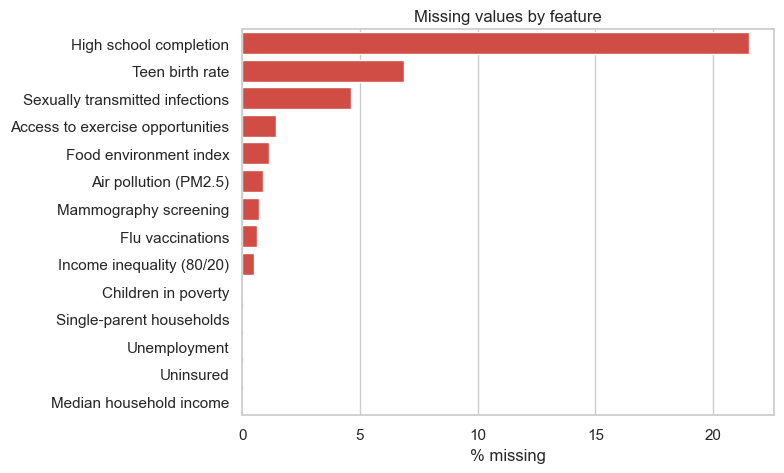

,pct_missing
High school completion,21.5
Teen birth rate,6.9
Sexually transmitted infections,4.6
Access to exercise opportunities,1.4
Food environment index,1.1
Air pollution (PM2.5),0.9
Mammography screening,0.7
Flu vaccinations,0.6
Income inequality (80/20),0.5
Children in poverty,0.0


In [19]:
miss = (model_df[FEATURE_NAMES].isna().mean() * 100).sort_values(ascending=False)
miss = miss[miss > 0]
print(f"Counties: {len(model_df):,}")
if len(miss):
    fig, ax = plt.subplots(figsize=(8, max(2, 0.35 * len(miss))))
    sns.barplot(x=miss.values, y=miss.index, color="#E6392E", ax=ax)
    ax.set(title="Missing values by feature", xlabel="% missing", ylabel="")
    plt.tight_layout(); plt.show()
miss.round(1).to_frame("pct_missing")

## 7. Exploratory analysis: what moves with drinking?

### Correlation with the target

A first pass: the Pearson correlation of each feature with excessive drinking. This is
linear and univariate, so it can miss nonlinear or interaction effects — but it orients
us. Note the strong **negative** correlation with % rural and several **positive**
correlations with other health behaviors.

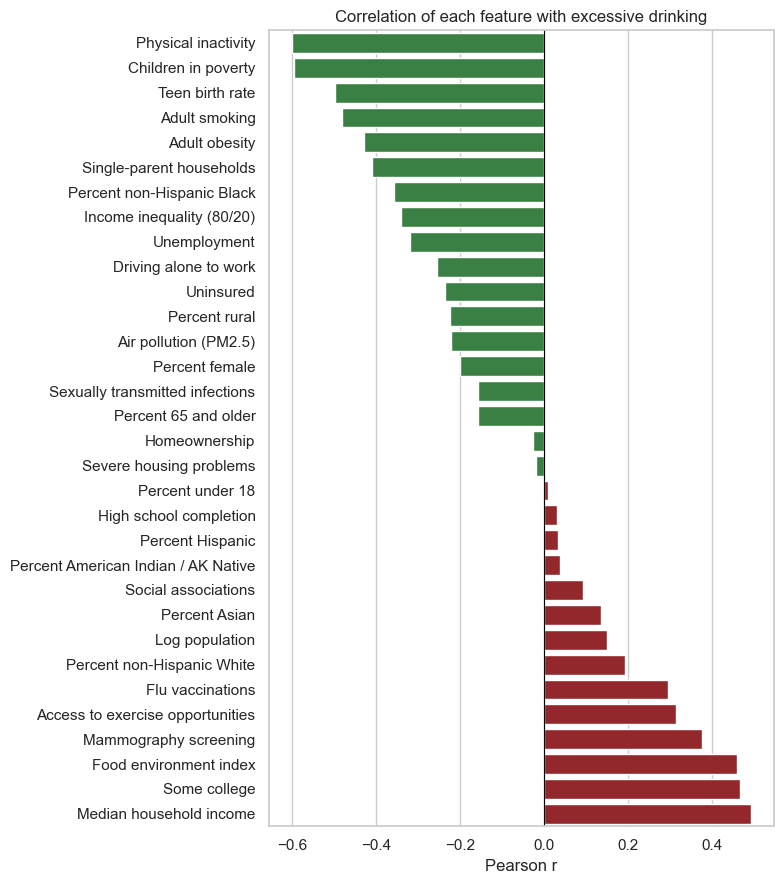

,pearson_r
Physical inactivity,-0.602
Children in poverty,-0.596
Teen birth rate,-0.498
Adult smoking,-0.483
Adult obesity,-0.430
Single-parent households,-0.411
Percent non-Hispanic Black,-0.358
Income inequality (80/20),-0.340
Unemployment,-0.320
Driving alone to work,-0.255


In [20]:
corr_target = (model_df[FEATURE_NAMES + ["excessive_drinking_pct"]]
               .corr()["excessive_drinking_pct"].drop("excessive_drinking_pct")
               .sort_values())
colors = ["#2E8B3C" if v < 0 else "#A4161A" for v in corr_target.values]
fig, ax = plt.subplots(figsize=(8, 9))
sns.barplot(x=corr_target.values, y=corr_target.index, palette=colors, ax=ax)
ax.axvline(0, color="black", lw=0.8)
ax.set(title="Correlation of each feature with excessive drinking",
       xlabel="Pearson r", ylabel="")
plt.tight_layout(); plt.show()
corr_target.round(3).to_frame("pearson_r")

### Feature correlation structure

Many predictors are correlated with each other (e.g. income, poverty, education move
together). This **multicollinearity** is why we will trust permutation importance and
SHAP over raw linear coefficients for interpretation, and why regularized and tree
models are appropriate.

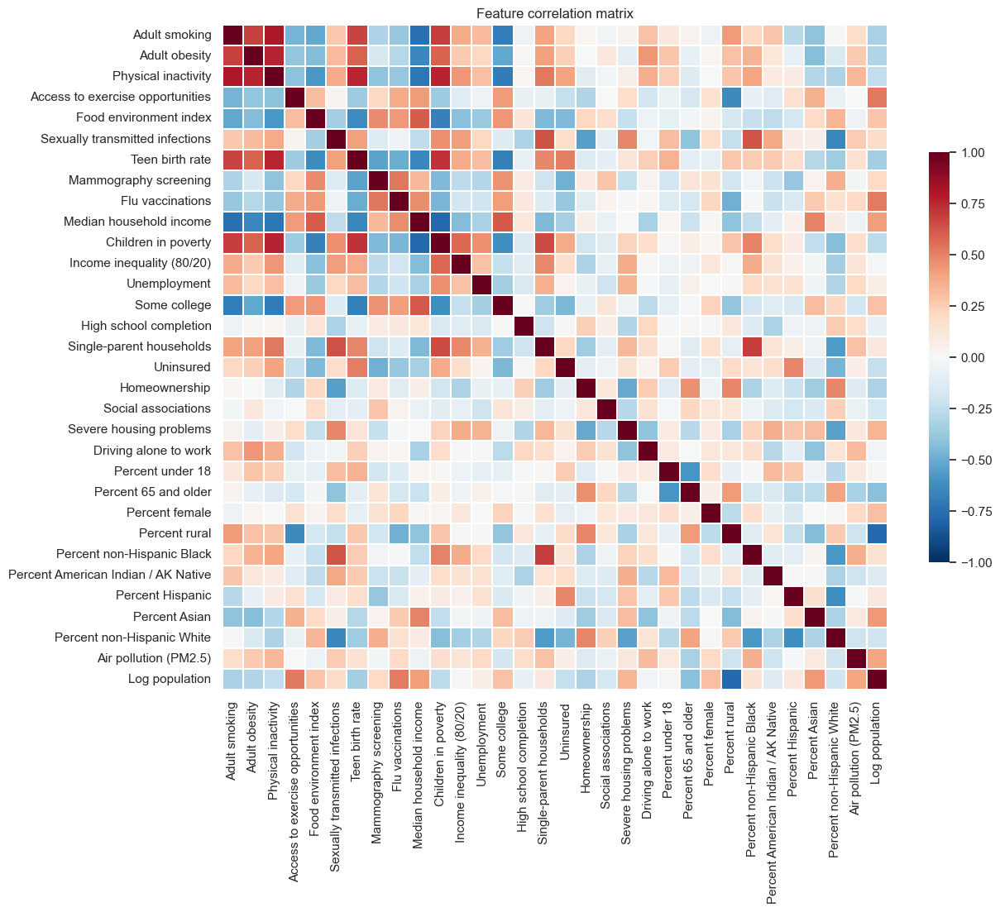

In [21]:
corr_mat = model_df[FEATURE_NAMES].corr()
fig, ax = plt.subplots(figsize=(13, 11))
sns.heatmap(corr_mat, cmap="RdBu_r", center=0, vmin=-1, vmax=1,
            square=True, linewidths=0.3, cbar_kws={"shrink": 0.6}, ax=ax)
ax.set_title("Feature correlation matrix")
plt.tight_layout(); plt.show()

### The strongest single relationships

Scatter plots of the four features most correlated (in absolute value) with the target,
with a regression line. These illustrate the direction and shape of the relationships
the model will exploit.

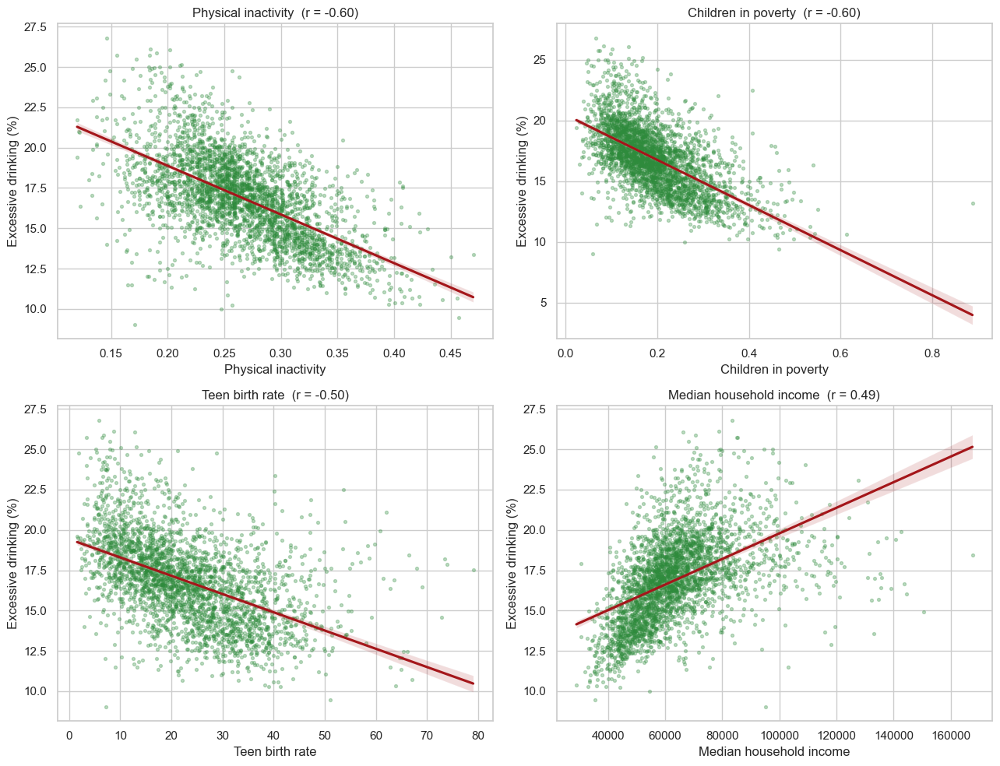

In [22]:
top_feats = corr_target.abs().sort_values(ascending=False).head(4).index.tolist()
fig, axes = plt.subplots(2, 2, figsize=(13, 10))
for ax, feat in zip(axes.ravel(), top_feats):
    sns.regplot(data=model_df, x=feat, y="excessive_drinking_pct", ax=ax,
                scatter_kws={"s": 8, "alpha": 0.3, "color": "#2E8B3C"},
                line_kws={"color": "#A4161A"})
    ax.set(title=f"{feat}  (r = {corr_target[feat]:.2f})", ylabel="Excessive drinking (%)")
plt.tight_layout(); plt.show()

## 8. Modeling

### Setup and the leakage we have to respect

We predict a county's excessive drinking rate from its features. Two design choices make
the evaluation honest:

1. **Group by state.** Counties within a state are correlated (shared policy, culture,
   climate). A random train/test split would let the model "memorize" a state from a few
   of its counties and look better than it is. We therefore hold out **entire states**
   for testing and use **`GroupKFold` by state** for cross-validation, so every
   validation county comes from a state the model never saw in training.
2. **One metric family, reported honestly.** RMSE and MAE in percentage points, plus R².

We compare a ladder of models from a naive baseline up to gradient boosting.

In [23]:
from sklearn.model_selection import GroupShuffleSplit, GroupKFold, cross_validate, RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor
from sklearn.dummy import DummyRegressor
from sklearn.inspection import permutation_importance, PartialDependenceDisplay
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import lightgbm as lgb

X = model_df[FEATURE_NAMES].copy()
y = model_df["excessive_drinking_pct"].copy()
groups = model_df["state"].copy()

splitter = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=RANDOM_STATE)
train_idx, test_idx = next(splitter.split(X, y, groups))
X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
g_train = groups.iloc[train_idx]
print(f"Train: {len(X_train):,} counties from {g_train.nunique()} states")
print(f"Test:  {len(X_test):,} counties from {groups.iloc[test_idx].nunique()} held-out states")

Train: 2,372 counties from 40 states
Test:  771 counties from 11 held-out states


In [24]:
# Model ladder. Linear/forest models need imputation (+ scaling for linear);
# HistGradientBoosting and LightGBM handle NaNs natively.
def linear_pipe(model):
    return Pipeline([("impute", SimpleImputer(strategy="median")),
                     ("scale", StandardScaler()), ("model", model)])

models = {
    "Baseline (mean)": Pipeline([("impute", SimpleImputer(strategy="median")),
                                 ("model", DummyRegressor(strategy="mean"))]),
    "Linear regression": linear_pipe(LinearRegression()),
    "Ridge": linear_pipe(Ridge(alpha=10.0, random_state=RANDOM_STATE)),
    "ElasticNet": linear_pipe(ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=RANDOM_STATE)),
    "Random forest": Pipeline([("impute", SimpleImputer(strategy="median")),
        ("model", RandomForestRegressor(n_estimators=400, min_samples_leaf=3,
                                        random_state=RANDOM_STATE, n_jobs=1))]),
    "HistGradientBoosting": Pipeline([("model", HistGradientBoostingRegressor(
        learning_rate=0.05, max_iter=500, max_leaf_nodes=31,
        l2_regularization=1.0, random_state=RANDOM_STATE))]),
    "LightGBM": Pipeline([("model", lgb.LGBMRegressor(
        n_estimators=600, learning_rate=0.03, num_leaves=31, subsample=0.8,
        colsample_bytree=0.8, random_state=RANDOM_STATE, n_jobs=1, verbose=-1))]),
}
# Inner models are single-threaded; we parallelize across CV folds instead
# (nested n_jobs=-1 oversubscribes cores and is dramatically slower on Windows).

gkf = GroupKFold(n_splits=5)
scoring = ["neg_root_mean_squared_error", "neg_mean_absolute_error", "r2"]
rows = []
for name, model in models.items():
    cv = cross_validate(model, X_train, y_train, groups=g_train, cv=gkf,
                        scoring=scoring, n_jobs=-1)
    rows.append({
        "model": name,
        "RMSE": -cv["test_neg_root_mean_squared_error"].mean(),
        "RMSE_std": cv["test_neg_root_mean_squared_error"].std(),
        "MAE": -cv["test_neg_mean_absolute_error"].mean(),
        "R2": cv["test_r2"].mean(),
    })
cv_results = pd.DataFrame(rows).sort_values("RMSE").reset_index(drop=True)
cv_results.round(3)

,model,RMSE,RMSE_std,MAE,R2
0,ElasticNet,1.862,0.585,1.408,0.498
1,Random forest,1.949,0.601,1.504,0.450
2,Ridge,1.950,0.507,1.500,0.440
3,LightGBM,1.965,0.623,1.519,0.440
4,Linear regression,1.976,0.501,1.525,0.421
5,HistGradientBoosting,1.992,0.598,1.541,0.422
6,Baseline (mean),2.688,0.511,2.128,-0.062


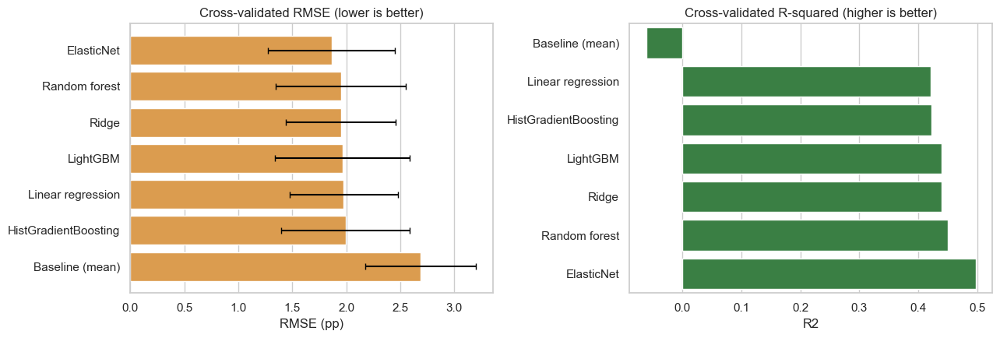

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
order = cv_results.sort_values("RMSE")
sns.barplot(data=order, x="RMSE", y="model", color="#F29E38", ax=axes[0])
axes[0].errorbar(order["RMSE"], range(len(order)), xerr=order["RMSE_std"],
                 fmt="none", ecolor="black", capsize=3)
axes[0].set(title="Cross-validated RMSE (lower is better)", xlabel="RMSE (pp)", ylabel="")
sns.barplot(data=cv_results.sort_values("R2"), x="R2", y="model", color="#2E8B3C", ax=axes[1])
axes[1].set(title="Cross-validated R-squared (higher is better)", xlabel="R2", ylabel="")
plt.tight_layout(); plt.show()

### An honest read of the comparison

The result is more interesting than "boosting wins": **all models cluster within ~0.13
RMSE of each other**, and a regularized **linear** model (ElasticNet) is marginally
*best*. That tells us the signal here is largely **additive and smooth** — there isn't a
lot of strong nonlinear interaction for trees to exploit, and aggressive trees slightly
overfit the within-state structure.

So why carry the **gradient-boosted** model forward for interpretation? Because it is
*statistically tied* with the linear model on accuracy, but lets us probe **nonlinear
shape and interactions** (via SHAP and partial dependence) that a linear model assumes
away. We tune it with **state-grouped** randomized search, then evaluate **once** on the
held-out states — and we confirm it matches the linear model's accuracy rather than
assuming it beats it.

In [26]:
best_name = cv_results.iloc[0]["model"]
spread = cv_results["RMSE"].iloc[:-1].max() - cv_results["RMSE"].min()  # exclude baseline
print(f"Best CV model: {best_name} (RMSE {cv_results.iloc[0]['RMSE']:.3f} pp)")
print(f"Non-baseline models span only {spread:.3f} pp RMSE - statistically a tie.")
print("Carrying LightGBM forward for nonlinear interpretation (SHAP, partial dependence).")

search_space = {
    "model__n_estimators": [300, 500, 700],
    "model__learning_rate": [0.03, 0.05],
    "model__num_leaves": [15, 31, 63],
    "model__min_child_samples": [20, 40],
    "model__subsample": [0.8, 1.0],
    "model__colsample_bytree": [0.8, 1.0],
}
lgbm_pipe = Pipeline([("model", lgb.LGBMRegressor(
    random_state=RANDOM_STATE, n_jobs=1, verbose=-1))])
search = RandomizedSearchCV(
    lgbm_pipe, search_space, n_iter=15, cv=gkf,
    scoring="neg_root_mean_squared_error", random_state=RANDOM_STATE, n_jobs=-1)
search.fit(X_train, y_train, groups=g_train)
print(f"Best CV RMSE: {-search.best_score_:.3f} pp")
print("Best params:", {k.replace('model__', ''): v for k, v in search.best_params_.items()})

best_model = search.best_estimator_
pred_test = best_model.predict(X_test)
test_metrics = pd.DataFrame({"metric": ["RMSE", "MAE", "R2"], "held_out_states": [
    np.sqrt(mean_squared_error(y_test, pred_test)),
    mean_absolute_error(y_test, pred_test),
    r2_score(y_test, pred_test)]})
test_metrics.round(3)

Best CV model: ElasticNet (RMSE 1.862 pp)
Non-baseline models span only 0.130 pp RMSE - statistically a tie.
Carrying LightGBM forward for nonlinear interpretation (SHAP, partial dependence).


Best CV RMSE: 1.960 pp
Best params: {'subsample': 0.8, 'num_leaves': 15, 'n_estimators': 700, 'min_child_samples': 20, 'learning_rate': 0.03, 'colsample_bytree': 0.8}


,metric,held_out_states
0,RMSE,1.777
1,MAE,1.450
2,R2,0.408


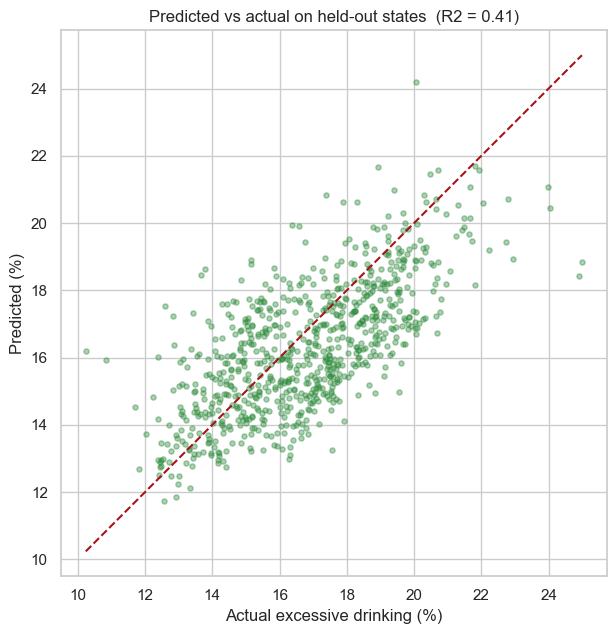

In [27]:
fig, ax = plt.subplots(figsize=(6.5, 6.5))
ax.scatter(y_test, pred_test, s=14, alpha=0.4, color="#2E8B3C")
lims = [min(y_test.min(), pred_test.min()), max(y_test.max(), pred_test.max())]
ax.plot(lims, lims, "--", color="#A4161A", lw=1.5)
ax.set(xlabel="Actual excessive drinking (%)", ylabel="Predicted (%)",
       title=f"Predicted vs actual on held-out states  (R2 = {r2_score(y_test, pred_test):.2f})")
ax.set_aspect("equal"); plt.tight_layout(); plt.show()

## 9. Model interpretation

A predictive model is only useful here if we can read *what* it learned. We use three
complementary tools:

- **Permutation importance** — how much test error grows when a feature is shuffled
  (model-agnostic, honest about the held-out data).
- **SHAP values** — per-county, per-feature contributions that decompose each
  prediction; robust to the multicollinearity we saw earlier.
- **Partial dependence** — the marginal shape of the relationship the model learned.

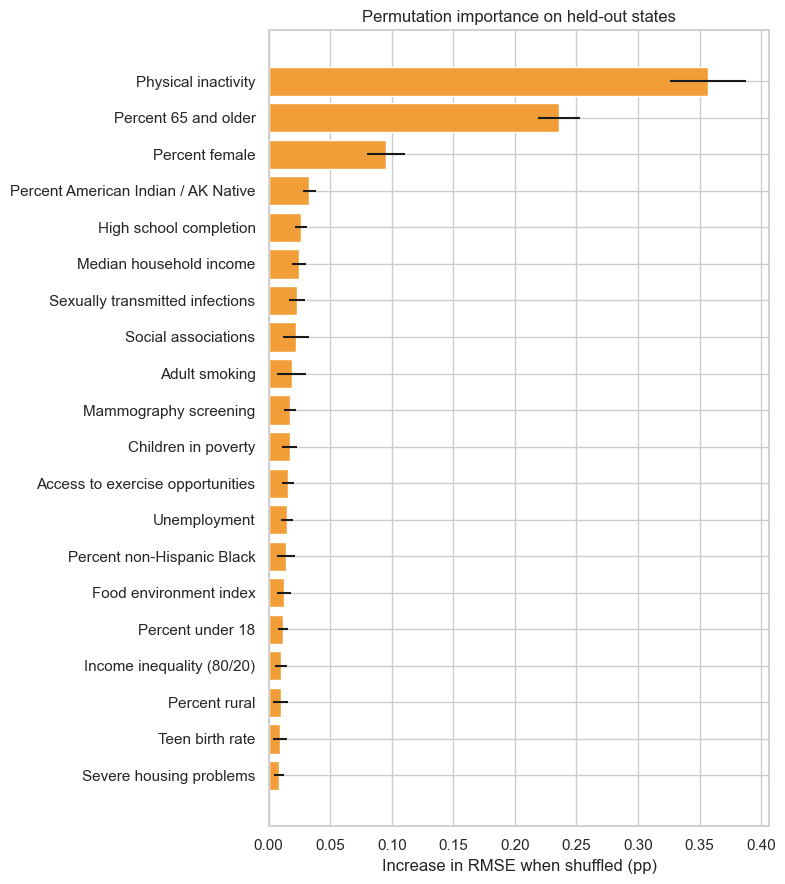

,feature,importance,std
2,Physical inactivity,0.357,0.031
22,Percent 65 and older,0.236,0.017
23,Percent female,0.095,0.015
26,Percent American Indian / AK Native,0.033,0.005
14,High school completion,0.026,0.005
9,Median household income,0.025,0.006
5,Sexually transmitted infections,0.023,0.006
18,Social associations,0.022,0.011
0,Adult smoking,0.019,0.012
7,Mammography screening,0.017,0.005


In [28]:
perm = permutation_importance(best_model, X_test, y_test, n_repeats=20,
                              random_state=RANDOM_STATE, n_jobs=-1,
                              scoring="neg_root_mean_squared_error")
perm_df = (pd.DataFrame({"feature": FEATURE_NAMES,
                         "importance": perm.importances_mean,
                         "std": perm.importances_std})
           .sort_values("importance", ascending=False))
fig, ax = plt.subplots(figsize=(8, 9))
top = perm_df.head(20).iloc[::-1]
ax.barh(top["feature"], top["importance"], xerr=top["std"], color="#F29E38")
ax.set(title="Permutation importance on held-out states",
       xlabel="Increase in RMSE when shuffled (pp)")
plt.tight_layout(); plt.show()
perm_df.head(15).round(3)

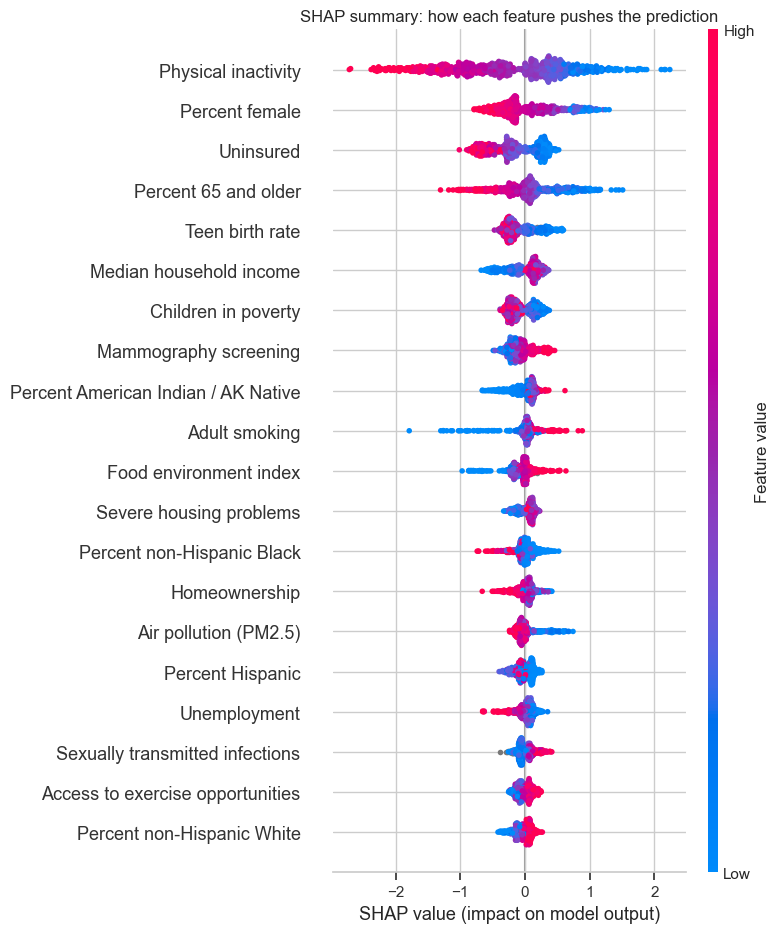

In [29]:
import shap

lgbm_final = best_model.named_steps["model"]
explainer = shap.TreeExplainer(lgbm_final)
# Explain a manageable sample of the test set for clarity and speed.
sample = X_test.sample(min(800, len(X_test)), random_state=RANDOM_STATE)
shap_values = explainer.shap_values(sample)

shap.summary_plot(shap_values, sample, feature_names=FEATURE_NAMES, show=False, max_display=20)
plt.title("SHAP summary: how each feature pushes the prediction")
plt.tight_layout(); plt.show()

The SHAP summary shows both the **magnitude** and **direction** of each feature's
effect. Red (high feature value) on the right means "high values of this feature
increase the predicted drinking rate." Below, partial-dependence plots show the learned
marginal shape for the most important features — note where relationships are nonlinear.

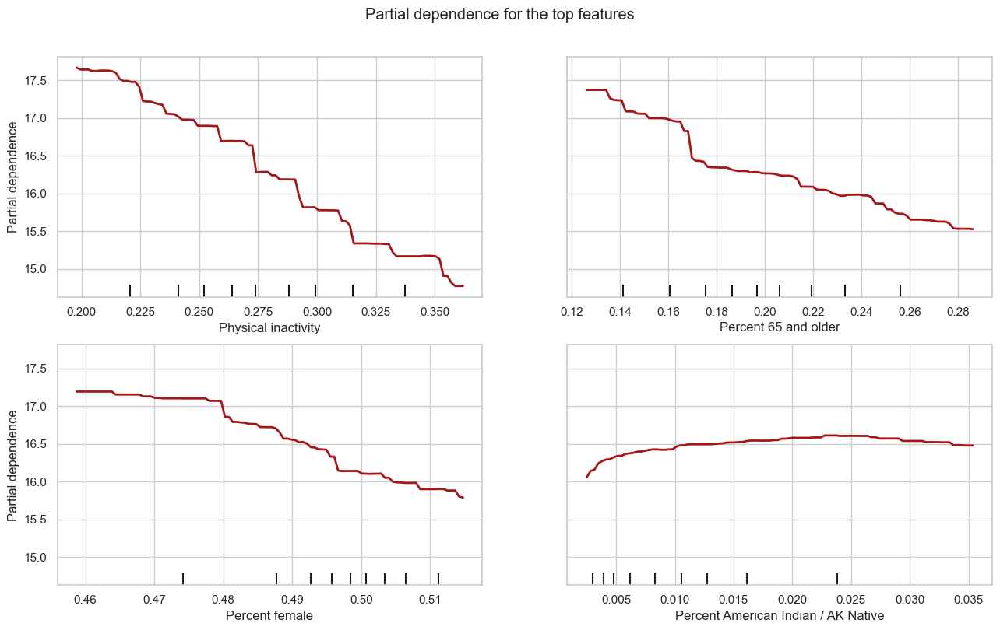

In [30]:
pdp_feats = perm_df["feature"].head(4).tolist()
fig, ax = plt.subplots(figsize=(13, 8))
PartialDependenceDisplay.from_estimator(
    best_model, X_test, pdp_feats, ax=ax, n_cols=2,
    line_kw={"color": "#A4161A", "linewidth": 2})
fig.suptitle("Partial dependence for the top features", y=1.01)
plt.tight_layout(); plt.show()

### Where does the model fail? Spatial residuals

Mapping the residuals (actual minus predicted) on the held-out states shows whether the
errors are random noise or have **geographic structure**. Clustered residuals would
signal a missing regional variable (policy, culture, religion) that county-level
features don't capture.

In [31]:
resid_df = model_df.iloc[test_idx][["fips", "state", "county", "excessive_drinking_pct"]].copy()
resid_df["predicted"] = pred_test
resid_df["residual"] = resid_df["excessive_drinking_pct"] - resid_df["predicted"]
resid_df["location_name"] = resid_df["county"] + ", " + resid_df["state"]

lim = float(resid_df["residual"].abs().quantile(0.98))
fig = px.choropleth(
    resid_df, geojson=county_geojson, locations="fips", featureidkey="id",
    color="residual", scope="usa", color_continuous_scale="RdBu_r",
    range_color=(-lim, lim), hover_name="location_name",
    hover_data={"excessive_drinking_pct": ":.1f", "predicted": ":.1f",
                "residual": ":.1f", "fips": True},
    labels={"residual": "Actual - Predicted (pp)"},
    title="Model residuals on held-out states (red = under-predicted)")
fig.update_geos(visible=False)
fig.update_layout(margin={"r": 0, "t": 70, "l": 0, "b": 0})
fig.show()
print(f"Residual mean {resid_df['residual'].mean():.3f} pp, "
      f"std {resid_df['residual'].std():.3f} pp")

Residual mean 0.472 pp, std 1.714 pp


## 10. Conclusions and limitations

**What we did.** We reproduced the county excessive-drinking choropleth, then went well
beyond it: validated the target, cross-checked it against two independent data sources,
engineered a verified ~30-feature predictor set from the County Health Rankings file,
explored the relationships, and trained a gradient-boosted model under a leakage-aware,
state-grouped evaluation.

**What we learned.**

- Excessive drinking has a strong, stable **regional geography** that survives across
  independent measurement systems (CHR survey, CDC PLACES survey, NIAAA sales).
- A meaningful share of cross-county variation (R² ≈ 0.4–0.5 on held-out states) is
  **predictable** from demographics, socioeconomics, and co-occurring health behaviors —
  with **physical inactivity, age structure, demographic composition (% female,
  race/ethnicity), and social connectedness** among the most important features.
- The relationship is **largely additive**: a regularized linear model matches gradient
  boosting on accuracy, so most of the signal is smooth rather than driven by strong
  nonlinear interactions.
- Residuals retain some **spatial structure**, which is expected: county-level features
  cannot capture state alcohol policy, religious composition, or cultural norms that
  plausibly drive part of the pattern.

**Limitations.**

- The target is a **modeled survey estimate** with real uncertainty (see the CI maps),
  not an observed count.
- All relationships are **associational, not causal**. Many features are mutually
  correlated, and some may be partly downstream of drinking.
- The model is **cross-sectional** (one year); it cannot speak to trends or effects of
  policy changes.
- We excluded leakage-prone features and downstream outcomes by design; a different
  feature set would shift the importance rankings.

**Natural next steps.** Add state fixed effects or an explicit region term to absorb the
residual geography; bring in external regressors (alcohol taxes, dry-county status,
religious adherence); model multiple years to study trends; and weight by population if
the goal shifts from "explain counties" to "estimate the resident-weighted national
picture."

*Reproducibility:* every remote source is cached under `data/raw/` with a provenance
record (URL, fetch time, SHA-256, row count); pinned dependencies are in
`requirements.txt`; and all randomness is seeded with `RANDOM_STATE`.